# Topic Modeling with Latent Dirichlet Analysis

Based on the tutorial at https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/

In [ ]:
# !pip install gensim==3.8.3

In [3]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# NTLK stopwords
from nltk.corpus import stopwords

# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import pickle 

import warnings
warnings.filterwarnings("ignore")

In [4]:
#update stopwords with frequent irrelevant words identified during EDA
stop_words = stopwords.words('english')
stop_words.extend(['use', 'used', 'using', 'one', 'like', 'user', 'make', 'also', 'get', 'point', 'let', 'go'])

In [47]:
filename = '../data/cleaned_no_outliers.csv'

In [10]:
df = pd.read_csv(filename)

In [11]:
#remove non-text, non-Y columns
df = df.drop(columns=['date', 'responses', 'author_url',
       'story_url', 'reading_time (mins)', 'number_sections', 
       'number_paragraphs'])

#### Combine Title & Subtitle

In [12]:
df['combined_title'] = (df['title'] + ' ' + df['subtitle'])

In [13]:
df = df.drop(columns = ['title', 'subtitle']).reset_index(drop=True)

#### Remove Punctuation & Make Lowercase

In [14]:
text_cols = ['section_titles', 'paragraphs', 'combined_title']

In [15]:
for col in text_cols:
    df[col] = df[col].map(lambda x: re.sub("[''·,\.!?'-]", '', x).lower())

#### Remove the 'Min Read' Phrase at the Beginning of Each Paragraph

In [16]:
#remove all text up to and including 'min read' in the beginning of the paragraphs
df['paragraphs'] = df['paragraphs'].map(lambda x: (x[x.index('min read')+9:] if (x.count('min read') > 0) else x))
                     

#### Remove the Brackets Surrounding The Section Titles

In [17]:
#remove brackets surrounding the section titles
df['section_titles'] = df['section_titles'].map(lambda x: x.replace("[",""))
df['section_titles'] = df['section_titles'].map(lambda x: x.replace("]",""))

#### Combine Text Columns

In [18]:
df['text'] = df['combined_title'] + df['section_titles'] + df['paragraphs']

In [19]:
df = df.drop(columns = ['section_titles', 'paragraphs', 'combined_title'])

In [20]:
# Convert to list
data = df['text'].values.tolist()

#### Tokenize Words and Clean Up Text

In [21]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True)) 

data_words = list(sent_to_words(data))

#### Bigram and Trigram Models

In [22]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [23]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

#### Remove Stop Words 

In [24]:
data_words_nostops = remove_stopwords(data_words)

#### Initialize Spacy 'en' Model

In [27]:
#!spacy download en_core_web_lg

In [51]:
nlp = spacy.load('en_core_web_lg')

In [55]:
# remove exception from rule-based exceptions - not a fan of "datum" showing up in my corpus along with data....
nlp.get_pipe('lemmatizer').lookups.get_table("lemma_exc")["noun"]["data"] = ["data"]

#### Lemmatize

In [58]:
data_lemmatized = lemmatization(data_words_nostops, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV','PROPN'])

#### Form Bigrams & Trigrams

In [59]:
data_words_bigrams = make_bigrams(data_lemmatized)

In [60]:
data_words_trigrams = make_trigrams(data_lemmatized)

### Bigram Modeling

#### Create the Dictionary & Corpus Needed for Topic Modeling

In [133]:
# Create Dictionary
id2word = corpora.Dictionary(data_words_bigrams)

# Create Corpus
texts = data_words_bigrams

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [62]:
#check out the dictionary

id2word[0]

'abbreviate'

In [63]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('abbreviate', 1),
  ('ability', 1),
  ('able', 2),
  ('ace', 5),
  ('achieve', 1),
  ('actual', 1),
  ('adapt', 1),
  ('addition', 1),
  ('additional', 1),
  ('aim', 1),
  ('airbnb', 1),
  ('algorithm', 5),
  ('allow', 1),
  ('always', 1),
  ('amazon', 1),
  ('amount', 1),
  ('analysis', 1),
  ('analytic', 1),
  ('answer', 3),
  ('appear', 5),
  ('apply', 4),
  ('approach', 3),
  ('approximate', 1),
  ('article', 1),
  ('ask', 7),
  ('aspect', 1),
  ('assumption', 2),
  ('base', 2),
  ('basic', 5),
  ('begin', 1),
  ('benefit', 1),
  ('book', 1),
  ('boost', 1),
  ('breadthfirst_search', 1),
  ('business', 3),
  ('candidate', 9),
  ('capability', 1),
  ('career', 1),
  ('carry', 1),
  ('catch', 1),
  ('categorization', 1),
  ('categorize', 3),
  ('category', 3),
  ('chance', 1),
  ('check', 2),
  ('choice', 3),
  ('choose', 1),
  ('clarify', 1),
  ('classic', 1),
  ('clearly', 2),
  ('code', 45),
  ('coderpad', 1),
  ('codesignal', 1),
  ('coding', 7),
  ('collection', 1),
  ('come'

### Build an LDA Model

Start with standard gensim LDA model

In [64]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [65]:
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.043*"data" + 0.016*"query" + 0.015*"database" + 0.013*"pipeline" + '
  '0.012*"cloud" + 0.011*"system" + 0.009*"service" + 0.009*"spark" + '
  '0.008*"application" + 0.008*"store"'),
 (1,
  '0.090*"model" + 0.024*"feature" + 0.022*"data" + 0.020*"training" + '
  '0.020*"dataset" + 0.019*"learning" + 0.016*"train" + 0.014*"machine" + '
  '0.012*"prediction" + 0.011*"learn"'),
 (2,
  '0.043*"image" + 0.008*"color" + 0.008*"show" + 0.008*"see" + 0.007*"map" + '
  '0.007*"video" + 0.006*"look" + 0.006*"well" + 0.006*"face" + '
  '0.006*"object"'),
 (3,
  '0.042*"data" + 0.008*"ai" + 0.008*"business" + 0.008*"team" + '
  '0.007*"customer" + 0.006*"company" + 0.006*"year" + 0.006*"product" + '
  '0.005*"system" + 0.005*"analysis"'),
 (4,
  '0.034*"data" + 0.016*"science" + 0.015*"learn" + 0.015*"work" + '
  '0.010*"time" + 0.009*"scientist" + 0.009*"good" + 0.008*"know" + '
  '0.008*"start" + 0.008*"project"'),
 (5,
  '0.016*"value" + 0.016*"variable" + 0.014*"probability" + 0.013*

### Compute Model Perplexity and Coherence Score

In [66]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -8.232203979273113

Coherence Score:  0.4472422515860178


### Visualize

In [67]:
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(lda_model, corpus, id2word)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, '../capstone_project/figures/LDA_spacy_TDS10.html')

In [68]:
plot

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.011733 -0.011033       1        1  17.920252
3      0.054281 -0.180097       2        1  15.271716
7     -0.004594  0.179027       3        1  11.784854
1     -0.033649  0.001675       4        1  11.420529
8      0.158117  0.204257       5        1   9.896291
5     -0.149477  0.001599       6        1   9.606202
6     -0.074248  0.036955       7        1   8.509386
2     -0.132620 -0.083003       8        1   6.034746
0      0.280724 -0.117673       9        1   4.825952
9     -0.110267 -0.031706      10        1   4.730071, topic_info=          Term           Freq          Total Category  logprob  loglift
242      model   60849.000000   60849.000000  Default  30.0000  30.0000
80        data  115227.000000  115227.000000  Default  29.0000  29.0000
940      image   18972.000000   18972.000000  Default  28.0000  28.0000
933   function   25816.000000   25816.000000  Default  27.0000  27.0000
416       word   11384.000000   11384.000000  Default  26.0000  26.0000
...        ...            ...            ...      ...      ...      ...
23     article    1499.132529   17525.200639  Topic10  -5.1185   0.5925
1661     state    1283.929170    7442.176408  Topic10  -5.2734   1.2940
1299     score    1242.864252    5310.254222  Topic10  -5.3059   1.5990
327     search    1219.239327    4636.901540  Topic10  -5.3251   1.7154
405     vector    1220.530479    5860.203052  Topic10  -5.3241   1.4823

[745 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
1124      2  0.033898  accuracy
1124      4  0.958095  accuracy
1124      6  0.007903  accuracy
2300      1  0.012201    action
2300      2  0.211756    action
...     ...       ...       ...
420       1  0.320856      year
420       2  0.556151      year
420       3  0.044176      year
420       6  0.020809      year
420       8  0.057894      year

[1916 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 8, 2, 9, 6, 7, 3, 1, 10])

There is lots of overlap and clustering of topics. I will try the Mallet algorithm next, and search over a range of topics to settle on the optimal one, using two criteria: 

1) Coherence Score
2) Visual separation and spread in the plot. 

#### Build LDA Mallet Model

In [69]:
import os
os.environ.update({'/Users/rachelinsler/dsi/downloads/mallet-2.0.8/bin/':r'Python/Mallet/mallet-2.0.8/bin'})

In [70]:
from gensim.test.utils import common_texts, get_tmpfile
from gensim.models import Word2Vec
from gensim.models.wrappers import LdaMallet

In [71]:
mallet_path = '/Users/rachelinsler/dsi/downloads/mallet-2.0.8/bin/mallet' # update this path
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=10, id2word=id2word)

In [72]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(0,
  [('image', 0.03839887926067358),
   ('model', 0.03136262469919673),
   ('training', 0.01658287483194559),
   ('network', 0.01567679323941116),
   ('layer', 0.015071232474325805),
   ('learning', 0.014743596985753504),
   ('deep', 0.01330651994622259),
   ('input', 0.013091862212330392),
   ('train', 0.012985663122931096),
   ('learn', 0.011632189621863456)]),
 (1,
  [('data', 0.055889514533556534),
   ('plot', 0.01930832445594278),
   ('create', 0.013068787094810531),
   ('visualization', 0.01192740830923756),
   ('dataset', 0.011609452790399374),
   ('show', 0.011329543231080288),
   ('line', 0.008674478770354589),
   ('graph', 0.00816357588538383),
   ('chart', 0.007701589234080483),
   ('map', 0.007633650020653521)]),
 (2,
  [('word', 0.030448127685696748),
   ('text', 0.020813103409788494),
   ('cluster', 0.013005748088621016),
   ('language', 0.009372732853395837),
   ('model', 0.009325297170601038),
   ('document', 0.008580277917294491),
   ('topic', 0.008571906914448351),

#### Compute Optimal Number of Topics

In [73]:
# function to find the optimal coherence value
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [79]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words_bigrams, start=4, limit=20, step=2)


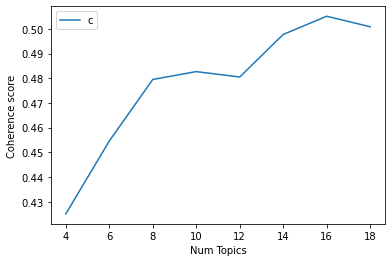

In [80]:
# Show graph
limit=20; start=4; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

### Create & Visualize Models with Optimal Number of Topics

This is a pretty tight coherence range; I will now explore select numbers of topics visually to see which make the most sense, starting with 8.

#### LDA Mallet Model: 8 Topics

In [134]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=8, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [135]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4612470465718269


In [136]:
# the pyLDAvis was throwing errors on the mallet model; so I found this code on stackoverflow: https://stackoverflow.com/questions/54684552/issue-with-topic-word-distributions-after-malletmodel2ldamodel-in-gensim
from gensim.models.ldamodel import LdaModel

def ldaMalletConvertToldaGen(mallet_model):
    model_gensim = LdaModel(id2word=mallet_model.id2word, num_topics=mallet_model.num_topics, alpha=mallet_model.alpha, eta=0, iterations=1000, gamma_threshold=0.001, dtype=np.float32)
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

In [137]:
converted_model = ldaMalletConvertToldaGen(ldamallet)
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_8.html')
plot

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.262127 -0.146441       1        1  11.760845
1     -0.120370  0.165229       2        1  14.220515
2      0.102187  0.194028       3        1  11.894192
3     -0.112163  0.165249       4        1  12.315372
4      0.148461 -0.093843       5        1  12.485055
5      0.075909 -0.055752       6        1   9.628739
6     -0.036623 -0.187064       7        1  12.552341
7      0.204727 -0.041406       8        1  15.142941, topic_info=         Term           Freq          Total Category  logprob  loglift
80       data  126851.000000  126851.000000  Default  30.0000  30.0000
242     model   66318.000000   66318.000000  Default  29.0000  29.0000
940     image   19541.000000   19541.000000  Default  28.0000  28.0000
322   science   17528.000000   17528.000000  Default  27.0000  27.0000
933  function   29229.000000   29229.000000  Default  26.0000  26.0000
..        ...            ...            ...      ...      ...      ...
153      good    4268.998630   17940.966296   Topic8  -5.2356   0.4519
225   machine    4336.599377   19680.305213   Topic8  -5.2199   0.3751
137      find    4005.354896   20123.265792   Topic8  -5.2993   0.2734
142    follow    3862.266113   19849.427054   Topic8  -5.3357   0.2507
279   problem    3727.064246   15929.598751   Topic8  -5.3713   0.4351

[783 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
423       6  0.973581      abcd
4094      2  1.000671  academic
1555      1  0.527521    access
1555      3  0.019606    access
1555      4  0.325336    access
...     ...       ...       ...
419       7  0.275219     write
420       2  0.376910      year
420       3  0.471780      year
420       4  0.113085      year
420       7  0.038143      year

[1426 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8])

Decent spread across the axes but too much overlap. 

#### LDA Mallet Model: 9 Topics

In [105]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=9, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [106]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.482791819093648


In [109]:
converted_model = ldaMalletConvertToldaGen(ldamallet)pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_9.html')
plot

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.146713 -0.093401       1        1  11.172776
1      0.093754 -0.112218       2        1  10.531961
2      0.082647  0.049628       3        1  10.098756
3     -0.035963  0.209550       4        1  14.900612
4     -0.121792 -0.081690       5        1   9.372410
5      0.099182  0.257794       6        1  11.133799
6     -0.280140  0.019859       7        1  11.348559
7     -0.129542 -0.123488       8        1  10.157321
8      0.145142 -0.126032       9        1  11.283806, topic_info=        Term           Freq          Total Category  logprob  loglift
80      data  127037.000000  127037.000000  Default  30.0000  30.0000
242    model   66623.000000   66623.000000  Default  29.0000  29.0000
940    image   19583.000000   19583.000000  Default  28.0000  28.0000
572  feature   21231.000000   21231.000000  Default  27.0000  27.0000
322  science   17310.000000   17310.000000  Default  26.0000  26.0000
..       ...            ...            ...      ...      ...      ...
27      base    3025.555165   11675.476209   Topic9  -5.2857   0.8314
279  problem    3064.169689   15930.187652   Topic9  -5.2730   0.5334
958   method    3036.912313   15162.816750   Topic9  -5.2819   0.5738
166     high    2907.440331    9958.643016   Topic9  -5.3255   0.9506
892     case    2947.190625   15609.810912   Topic9  -5.3119   0.5148

[872 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
423       6  0.990091            abcd
1555      4  0.011653          access
1555      5  0.182763          access
1555      6  0.165999          access
1555      7  0.537862          access
...     ...       ...             ...
1340      9  0.880500  wwwicunicampbr
420       3  0.382595            year
420       4  0.382595            year
420       5  0.029241            year
420       6  0.205672            year

[1622 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9])

interpret

#### LDA Mallet Model: 10 Topics

In [114]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=10, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [115]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.48537638658319143


In [116]:
converted_model = ldaMalletConvertToldaGen(ldamallet)
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_10.html')
plot

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.144218  0.096118       1        1  10.928874
1      0.155923  0.023021       2        1   9.501594
2     -0.113035 -0.278429       3        1  10.092527
3      0.000891  0.154164       4        1   9.472275
4      0.174075  0.064134       5        1  10.906809
5      0.114394 -0.204751       6        1  10.147243
6     -0.219390  0.173667       7        1  10.401696
7      0.061681 -0.004504       8        1   7.631177
8     -0.182364  0.035200       9        1  12.178633
9     -0.136393 -0.058619      10        1   8.739174, topic_info=          Term           Freq          Total Category  logprob  loglift
80        data  127175.000000  127175.000000  Default  30.0000  30.0000
242      model   66438.000000   66438.000000  Default  29.0000  29.0000
940      image   19577.000000   19577.000000  Default  28.0000  28.0000
933   function   29296.000000   29296.000000  Default  27.0000  27.0000
322    science   17472.000000   17472.000000  Default  26.0000  26.0000
...        ...            ...            ...      ...      ...      ...
384       time    2705.144008   29292.714266  Topic10  -5.1421   0.0552
1419    google    1655.045917    5117.161953  Topic10  -5.6334   1.3086
906     create    2063.671049   24751.157044  Topic10  -5.4127  -0.0470
1695     build    1842.237327   12195.797519  Topic10  -5.5262   0.5472
331        set    1821.691833   19682.700760  Topic10  -5.5375   0.0574

[955 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
423       8  0.973027      abcd
425       7  1.028458   acclaim
1124      2  0.170547  accuracy
1124      5  0.829415  accuracy
2300      1  0.576807    action
...     ...       ...       ...
420       4  0.486376      year
420       7  0.157469      year
420       9  0.329398      year
420      10  0.026715      year
1343      5  1.062431    youden

[1893 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

#### LDA Mallet Model: 11 Topics

In [117]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=11, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [118]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4941171872212273


In [123]:
#convert and visualize
converted_model = ldaMalletConvertToldaGen(ldamallet)
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_11.html')
plot

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.130506 -0.129755       1        1  13.851623
1      0.111844 -0.053808       2        1  13.060638
2      0.122545  0.234869       3        1  13.443890
3      0.156341 -0.123824       4        1  14.431444
4     -0.056529  0.188716       5        1  18.250383
5      0.080435 -0.117089       6        1  13.179324
6     -0.284128  0.000890       7        1  13.782699, topic_info=         Term           Freq          Total Category  logprob  loglift
242     model   66708.000000   66708.000000  Default  30.0000  30.0000
80       data  126416.000000  126416.000000  Default  29.0000  29.0000
933  function   29487.000000   29487.000000  Default  28.0000  28.0000
940     image   19651.000000   19651.000000  Default  27.0000  27.0000
322   science   17319.000000   17319.000000  Default  26.0000  26.0000
..        ...            ...            ...      ...      ...      ...
80       data    5287.080954  126416.007697   Topic7  -4.9276  -1.1926
387      tool    3303.442815    9109.024548   Topic7  -5.3979   0.9675
417      work    3675.234456   24379.977410   Topic7  -5.2912   0.0896
331       set    3415.766566   19753.790706   Topic7  -5.3644   0.2268
384      time    3145.066063   29291.461498   Topic7  -5.4470  -0.2497

[684 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
423       3  0.987251    abcd
1555      1  0.151863  access
1555      3  0.124028  access
1555      5  0.059968  access
1555      7  0.664146  access
...     ...       ...     ...
417       6  0.084126    work
417       7  0.150738    work
420       1  0.051708    year
420       3  0.567436    year
420       5  0.380870    year

[1164 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7])

#### LDA Mallet Model: 7 Topics

In [120]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=7, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [121]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4499053953515461


In [122]:
#convert and visualize
converted_model = ldaMalletConvertToldaGen(ldamallet)
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_7.html')
plot

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.130506 -0.129755       1        1  13.851627
1      0.111844 -0.053808       2        1  13.060638
2      0.122545  0.234869       3        1  13.443889
3      0.156341 -0.123824       4        1  14.431440
4     -0.056529  0.188716       5        1  18.250384
5      0.080435 -0.117089       6        1  13.179325
6     -0.284128  0.000890       7        1  13.782696, topic_info=         Term           Freq          Total Category  logprob  loglift
242     model   66708.000000   66708.000000  Default  30.0000  30.0000
80       data  126416.000000  126416.000000  Default  29.0000  29.0000
933  function   29487.000000   29487.000000  Default  28.0000  28.0000
940     image   19651.000000   19651.000000  Default  27.0000  27.0000
322   science   17319.000000   17319.000000  Default  26.0000  26.0000
..        ...            ...            ...      ...      ...      ...
80       data    5287.080040  126416.014682   Topic7  -4.9276  -1.1926
387      tool    3303.442243    9109.024605   Topic7  -5.3979   0.9675
417      work    3675.233821   24379.978567   Topic7  -5.2912   0.0896
331       set    3415.765976   19753.789856   Topic7  -5.3644   0.2268
384      time    3145.065519   29291.461500   Topic7  -5.4470  -0.2497

[698 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
423        3  0.987251      abcd
1555       1  0.151863    access
1555       3  0.124029    access
1555       5  0.059968    access
1555       7  0.664146    access
...      ...       ...       ...
12833      1  0.997123  workbook
1682       5  1.015296    wrench
420        1  0.051708      year
420        3  0.567436      year
420        5  0.380870      year

[1178 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7])

#### LDA Mallet Model: 6 Topics

In [138]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=6, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [139]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_bigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.44390811660358304


In [140]:
#convert and visualize
converted_model = ldaMalletConvertToldaGen(ldamallet)
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_6.html')
plot

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.172416 -0.096708       1        1  17.190817
1     -0.086479 -0.176160       2        1  17.762929
2      0.110135 -0.131346       3        1  15.496360
3      0.014330  0.189867       4        1  20.121768
4      0.272278  0.022881       5        1  15.039416
5     -0.137847  0.191466       6        1  14.388710, topic_info=         Term           Freq          Total Category  logprob  loglift
242     model   66108.000000   66108.000000  Default  30.0000  30.0000
80       data  126698.000000  126698.000000  Default  29.0000  29.0000
933  function   29373.000000   29373.000000  Default  28.0000  28.0000
940     image   19497.000000   19497.000000  Default  27.0000  27.0000
322   science   17376.000000   17376.000000  Default  26.0000  26.0000
..        ...            ...            ...      ...      ...      ...
292  question    2199.478579    9425.914532   Topic6  -5.8476   0.4835
663      make    2321.989833   13822.689001   Topic6  -5.7934   0.1548
384      time    2357.483864   29289.974418   Topic6  -5.7783  -0.5809
150      give    2233.827492   16018.970028   Topic6  -5.8321  -0.0313
253    number    2238.407430   19577.181291   Topic6  -5.8301  -0.2299

[570 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
423       6  0.982562            abcd
1555      3  0.136148          access
1555      4  0.063902          access
1555      5  0.672193          access
1555      6  0.127601          access
...     ...       ...             ...
4627      5  1.061175  wwwanacondacom
420       1  0.057375            year
420       3  0.101265            year
420       4  0.528271            year
420       6  0.313113            year

[911 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6])

In [156]:
feature_vecs = []
for i in range(len(data_words_bigrams)):
    top_topics = (
        ldamallet.get_topics(data_words_bigrams[i])
    )
    topic_vec = [top_topics[i][1] for i in range(6)]
    topic_vec.extend([df.iloc[i].real_counts])
    topic_vec.extend([len(df.iloc[i].text)])
    feature_vecs.append(topic_vec)

TypeError: get_topics() takes 1 positional argument but 2 were given

In [152]:
for i in range(len(df)):
    print(ldamallet.get_topics(data_words_bigrams[i]))

TypeError: get_topics() takes 1 positional argument but 2 were given

In [153]:
data_words_bigrams

[['ultimate',
  'guide',
  'ace',
  'code',
  'interview',
  'data',
  'scientist',
  'data',
  'science',
  'ultimate',
  'guide',
  'ace',
  'code',
  'interview',
  'data',
  'scientist',
  'introduction',
  'table',
  'content',
  'coding',
  'question',
  'ask',
  'ds',
  'interview',
  'role',
  'likely',
  'code',
  'interview',
  'expect',
  'coding',
  'interview',
  'different',
  'category',
  'code',
  'interview',
  'prepare',
  'evaluate',
  'tip',
  'ace',
  'code',
  'interview',
  'final',
  'thought',
  'thank',
  'emma',
  'de',
  'rob',
  'wang',
  'data',
  'science',
  'd',
  'relatively',
  'new',
  'profession',
  'compare',
  'type',
  'role',
  'tech',
  'industry',
  'software',
  'engineering',
  'product',
  'management',
  'initially',
  'd',
  'interview',
  'limit',
  'code',
  'component',
  'include',
  'sql',
  'apply',
  'data',
  'manipulation',
  'session',
  'python',
  'recent',
  'year',
  'however',
  'ds',
  'interview',
  'show',
  'increase'

### Trigram Modeling

#### Create the Dictionary & Corpus Needed for Topic Modeling

In [127]:
# Create Dictionary
id2word = corpora.Dictionary(data_words_trigrams)

# Create Corpus
texts = data_words_trigrams

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

#### Build LDA Mallet Model With Trigrams

In [128]:
mallet_path = '/Users/rachelinsler/dsi/downloads/mallet-2.0.8/bin/mallet' # update this path
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=10, id2word=id2word)

In [129]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_words_trigrams, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(0,
  [('time', 0.03015017744768426),
   ('work', 0.01925270206841771),
   ('good', 0.01715646192042783),
   ('thing', 0.015669766780009472),
   ('problem', 0.013123270389492889),
   ('code', 0.013114774988690498),
   ('start', 0.012955486223645674),
   ('lot', 0.011016410990500018),
   ('find', 0.010821016772045035),
   ('make', 0.009555202052488833)]),
 (1,
  [('model', 0.09242589870862122),
   ('feature', 0.02598797363195269),
   ('training', 0.02092148689007328),
   ('dataset', 0.020443779606083273),
   ('learning', 0.02032348105646535),
   ('image', 0.018151133334379406),
   ('train', 0.016353628919073944),
   ('data', 0.015713780111685872),
   ('machine', 0.012840562578782475),
   ('learn', 0.01269759908503364)]),
 (2,
  [('word', 0.030875620370213176),
   ('text', 0.019738666395033643),
   ('language', 0.00959487066306753),
   ('topic', 0.008448918843975122),
   ('document', 0.008267830161451878),
   ('sentence', 0.00772173460321772),
   ('nlp', 0.007311455556875994),
   ('task

#### Compute Optimal Number of Topics

In [130]:
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_words_trigrams, start=4, limit=20, step=2)


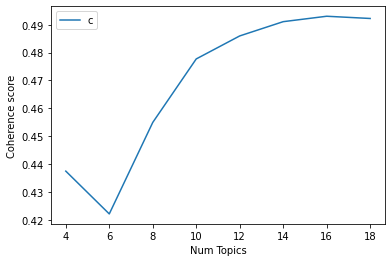

In [131]:
# Show graph
limit=20; start=4; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

### Create Model with Optimal Number of Topics

#### 

In [ ]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=16, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_trigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
converted_model = ldaMalletConvertToldaGen(ldamallet)
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_16.html')
plot

This doesn't look great. There was a local coherence maximum at 8 topics, which also makes a bit more sense visually - I will try that next. 

In [ ]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=8, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_trigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def ldaMalletConvertToldaGen(mallet_model):
    model_gensim = LdaModel(id2word=mallet_model.id2word, num_topics=mallet_model.num_topics, alpha=mallet_model.alpha, eta=0, iterations=1000, gamma_threshold=0.001, dtype=np.float32)
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

converted_model = ldaMalletConvertToldaGen(ldamallet)

In [ ]:
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_8.html')

In [ ]:
plot

In [ ]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=7, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_trigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def ldaMalletConvertToldaGen(mallet_model):
    model_gensim = LdaModel(id2word=mallet_model.id2word, num_topics=mallet_model.num_topics, alpha=mallet_model.alpha, eta=0, iterations=1000, gamma_threshold=0.001, dtype=np.float32)
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

converted_model = ldaMalletConvertToldaGen(ldamallet)

In [ ]:
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_7.html')

In [ ]:
plot

In [ ]:
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=6, id2word=id2word,
                     iterations=2000,
                      topic_threshold=0.1,
                      random_seed=42,)

In [ ]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamallet, texts=data_words_trigrams, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

In [ ]:
def ldaMalletConvertToldaGen(mallet_model):
    model_gensim = LdaModel(id2word=mallet_model.id2word, num_topics=mallet_model.num_topics, alpha=mallet_model.alpha, eta=0, iterations=1000, gamma_threshold=0.001, dtype=np.float32)
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

converted_model = ldaMalletConvertToldaGen(ldamallet)

In [ ]:
pyLDAvis.enable_notebook()
plot = gensimvis.prepare(converted_model, corpus, id2word, sort_topics=False)
# Save pyLDA plot as html file
pyLDAvis.save_html(plot, 'figures/LDA_mallet_6.html')